## Mini-project
ME 639 - Introduction to Robotics

### IIT Gandhinagar

___________________________________________________

> Assigned: 7 August, 2023

Due: 11:59pm on Tuesday, 15th August, 2023

on GitHub repository: Link will be shared shortly.



> Collaboration Policy:

Collaboration is not permitted on this assignment. All submitted
material must be your own material.
Consider the 2R elbow manipulator discussed in class with two links of masses m1
& m2, lengths l1 & l2, and moments of inertia I1 and I2, respectively.

> Tasks:

0. Include a neat handwritten derivation of the 6 key equations derived in
class with regard to the kinematics, dynamics, and statics of the elbow
manipulator. Include neat free-body diagrams, assumptions, and any
explanations to go with the derivations.

1. Write a Python simulation with visualization that implements a trajectory
following controller that makes the robot follow an arbitrary end-tip
trajectory.
a. Also, analyze how different the results are when dynamics are
included versus not included (try both low-speed and high-speed
trajectories).

2. Assume a wall location and orientation, develop and implement using a
Python simulation and visualization the task of the robot reaching the wall
and then applying a prespecified force in the normal direction of the wall.
3. Develop and implement a control scheme that makes the robot end-tip act
like a virtual spring centered at the mean position of xo and yo.
Demonstrate the performance of this method by initializing from a few
different points away from xo and yo.
4. If both joint angles can only sweep between 35 degrees and 145 degrees,
determine and plot the workspace for the robot.


Hint: Please note that each of the above tasks may involve many sub tasks. For instance, for each of
the tasks, first, a robot dynamics model has to be coded up to simulate the behaviour of the robot
and observe the effects of any control or environmental action taken. Likewise, a separate
visualization subroutine can be written that can serve to support all the codes and tasks. Further,
for task one, you might also have to verify first if the trajectory chosen is in the workspace (and
hence feasible). There may be a few more checks like these. These are fairly complex coding tasks so
please start well ahead of the deadline.

# 2R manipulator

In [ ]:
M = [100, 50]   # Link masses
L = [100, 50]   # Link lengths
g = 9.8         # Gravity

q = [35, 35]    # relative joint angles

## Miscelleneous Func

Utils & Example function for Plotting and Alphashaping

In [ ]:
# Import necessary functions

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd


In [ ]:
q=[0, 0]

str(type(q)) == "<class 'list'>"

True

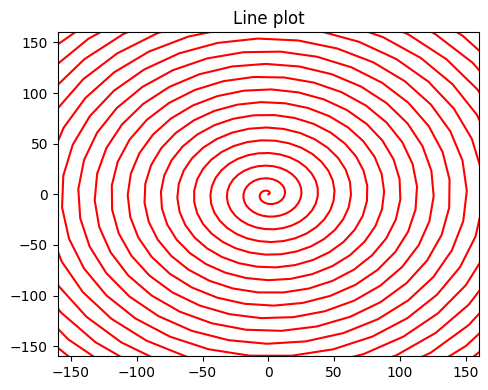

In [ ]:
def Line_plot_array(A, title="Line plot"):
  plt.rcParams["figure.figsize"] = [5, 4]
  plt.rcParams["figure.autolayout"] = True

  lim = L[0]+L[1]+10
  plt.xlim(-lim, lim)
  plt.ylim(-lim, lim)

  A = A.transpose()
  plt.title(title)
  plt.plot(A[0], A[1], color="red")

  plt.show()

THETA = np.linspace(0, 720, 3600)
R = 2*THETA
A = np.array([R*np.cos(THETA), R*np.sin(THETA)]).transpose()

Line_plot_array(A)

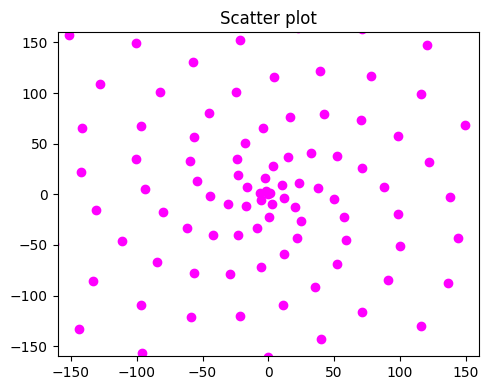

In [ ]:
def Scatter_plot_array(A, title="Scatter plot"):
  plt.rcParams["figure.figsize"] = [5, 4]
  plt.rcParams["figure.autolayout"] = True

  A = A.transpose()

  lim = L[0]+L[1]+10
  plt.xlim(-lim, lim)
  plt.ylim(-lim, lim)

  plt.title(title)
  plt.scatter(A[0], A[1], color="magenta")

  plt.show()

THETA = np.linspace(0, 720, 720)
R = 2*THETA
B = np.array([R*np.cos(THETA), R*np.sin(THETA)]).transpose()

Scatter_plot_array(B)

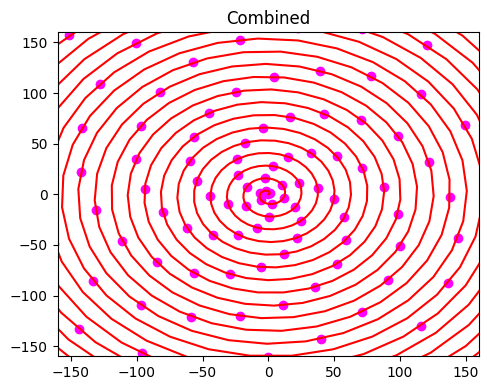

In [ ]:
def Scatter_plot_line(A, B, title="Combined"):
  plt.rcParams["figure.figsize"] = [5, 4]
  plt.rcParams["figure.autolayout"] = True

  A = A.transpose()
  B = B.transpose()

  lim = L[0]+L[1]+10
  plt.xlim(-lim, lim)
  plt.ylim(-lim, lim)

  plt.title(title)
  plt.scatter(A[0], A[1], color="magenta")

  plt.plot(B[0], B[1], color="red")

  plt.show()

Scatter_plot_line(B, A)

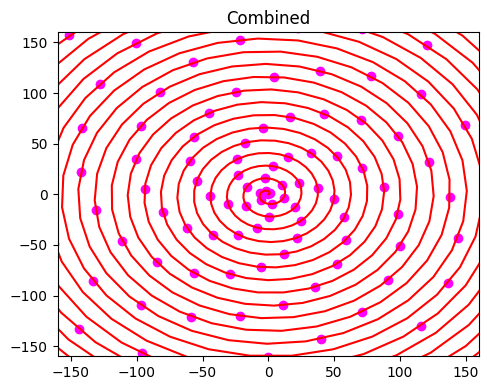

In [ ]:
def Scatter_plot_scatter(A, B, title="Combined"):
  plt.rcParams["figure.figsize"] = [5, 4]
  plt.rcParams["figure.autolayout"] = True

  A = A.transpose()
  B = B.transpose()

  lim = L[0]+L[1]+10
  plt.xlim(-lim, lim)
  plt.ylim(-lim, lim)

  plt.title(title)
  plt.scatter(A[0], A[1], color="magenta")

  plt.plot(B[0], B[1], color="blue")
  plt.scatter(B[0], B[1], color="green")

  plt.show()

Scatter_plot_line(B, A)

In [ ]:
!pip install alphashape descartes

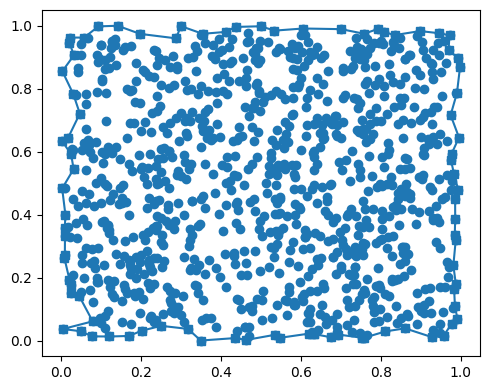

In [ ]:
import alphashape
import numpy as np
from descartes import PolygonPatch
import matplotlib.pyplot as plt

n = 1000
points = np.random.rand(n, 2)

# Define alpha parameter
alpha= 20

# Generate the alpha shape
alpha_shape = alphashape.alphashape(points, alpha)

# Initialize plot
fig, ax = plt.subplots()

# Plot input points
ax.scatter(*zip(*points))

# Plot alpha shape
#ax.add_patch(PolygonPatch(alpha_shape, alpha=.5, fc='blue', ec='red'))


pnts = [x for x in alpha_shape.boundary.coords]
plt.plot(*zip(*pnts),marker='s')



plt.show()

## Functions of Key Equtions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from matplotlib.animation import FuncAnimation

In [ ]:

# Using Forward Kinematics for Computing the position of Manipulator
def forward_kinematics_eq1(q):

    x1 = L[0]*np.cos(q[0]*np.pi/180)
    y1 = L[0]*np.sin(q[0]*np.pi/180)

    x2 = x1 + L[1]*np.cos((q[0] + q[1])*np.pi/180)
    y2 = y1 + L[1]*np.sin((q[0] + q[1])*np.pi/180)

    coordinates = [[0, round(x1, 2), round(x2, 2)],
                   [0, round(y1, 2), round(y2, 2)]]

    return coordinates


def manipulator_velocity_eq2(dq_dt):

  dx1_dt = -L[0]*np.sin(q[0]*np.pi/180)*dq_dt[0]
  dy1_dt = L[0]*np.cos(q[0]*np.pi/180)*dq_dt[0]

  dx2_dt = dx1_dt - L[1]*np.sin((q[0] + q[1])*np.pi/180)*dq_dt[1]
  dy2_dt = dy1_dt + L[1]*np.cos((q[0] + q[1])*np.pi/180)*dq_dt[1]

  return [[0, dx1_dt, dx2_dt],
          [0, dy1_dt, dy2_dt]]


# Using Inverse Kinematics for Computing the angles of Manipulator
def inverse_kinematics_eq3(x, y):
  q2 = np.arccos((x**2 + y**2 - L[0]**2 - L[1]**2)/(2*L[0]*L[1]))

  if (x==0): q1 = np.pi/2 - np.arctan((L[1]*np.sin(q2)/(L[0]+L[1]*np.cos(q2))))
  else: q1 = np.arctan(y/x) - np.arctan((L[1]*np.sin(q2)/(L[0]+L[1]*np.cos(q2))))

  q1 = round(q1*180/np.pi, 2)
  if (q1<0): q1 += 180
  q2 = round(q2*180/np.pi, 2)
  if (q2<0): q2 += 180

  return q1, q2


# Static force on End-effector & Torque to constant reaction Force, may be whever it reaches certain co-ordinate
def manipulator_torque_eq4(q, F):
  T1 = -L[0]*np.sin(q[0]*np.pi/180)*F[0] + L[1]*np.sin((q[0] + q[1])*np.pi/180)*F[1]
  T2 = -L[0]*np.cos(q[0]*np.pi/180)*F[0] + L[1]*np.cos((q[0] + q[1])*np.pi/180)*F[1]

  # CCW is +ve
  return [T1, T2]


# When in motion, Torque required at given angle for desired acceleration (based on time)
def Manipulator_dynamics_eq6(dw_dt, dq_dt, q):

  T1 = (1/3)*M[0]*L[0]**2*dw_dt[0] + M[1]*L[1]**2*dw_dt[0] + M[1]*(L[0]*L[1]/2)*dw_dt[1]*np.cos((q[1]-q[0])*np.pi/180) \
        - M[1]*(L[0]*L[1]/2)*dq_dt[1]*(dq_dt[1] - dq_dt[0])*np.sin((q[1]-q[0])*np.pi/180) - M[0]*g*(L[0]/2)*np.cos(q[0]*np.pi/180) \
        - M[1]*g*(L[0]/2)*np.cos(q[0]*np.pi/180)

  T2 = (1/3)*M[1]*L[1]**2*dw_dt[1] + (1/4)*M[1]*L[1]**2*dw_dt[1] + M[1]*(L[0]*L[1]/2)*dw_dt[0]*np.cos((q[1]-q[0])*np.pi/180) \
        - M[1]*(L[0]*L[1]/2)*dq_dt[0]*(dq_dt[1] - dq_dt[0])*np.sin((q[1]-q[0])*np.pi/180) - M[1]*g*(L[1]/2)*np.cos(q[1]*np.pi/180)

  return [T1, T2]


# Dynamics: Equations of motion for the manipulator
def ODE_dynamics(state, t):
    theta, omega = state
    dtheta_dt = omega
    domega_dt = -(g / L) * np.sin(theta)
    return [dtheta_dt, domega_dt]



In [ ]:
C = forward_kinematics_eq1(q)
C

[[0, 81.92, 99.02], [0, 57.36, 104.34]]

In [ ]:
manipulator_velocity_eq2([1, 1])

[[0, -57.35764363510461, -104.34227467440002],
 [0, 81.91520442889917, 99.01621159518261]]

In [ ]:
Q = inverse_kinematics_eq3(C[0][2], C[1][2])
Q

(35.0, 35.0)

In [ ]:
T = manipulator_torque_eq4(q, [-10, 10])
T

[1043.4227467440003, 990.1621159518262]

In [ ]:
T = Manipulator_dynamics_eq6([1, 1], [10, 10], q)
T

[523125.6580780923, 187882.0541241265]

In [ ]:
t_max = 10
num_steps = 1000

# Time array
time = np.linspace(0, t_max, num_steps)

# Initial conditions
q = [35, 35]      # initial angle (radians)
w = [0.0, 0.0]    # initial angular velocity (rad/s)
initial_state = [q, w]


# Integrate using odeint
#states = odeint(ODE_dynamics, initial_state, time)
#states.shape

## Task-4

If both joint angles can only sweep between 35 degrees and 145 degrees, determine and plot the workspace for the robot.

array([[ 99.02,  98.56,  98.11, ..., -65.72, -65.27, -64.81],
       [104.34, 104.51, 104.66, ...,  10.05,  10.21,  10.37]])

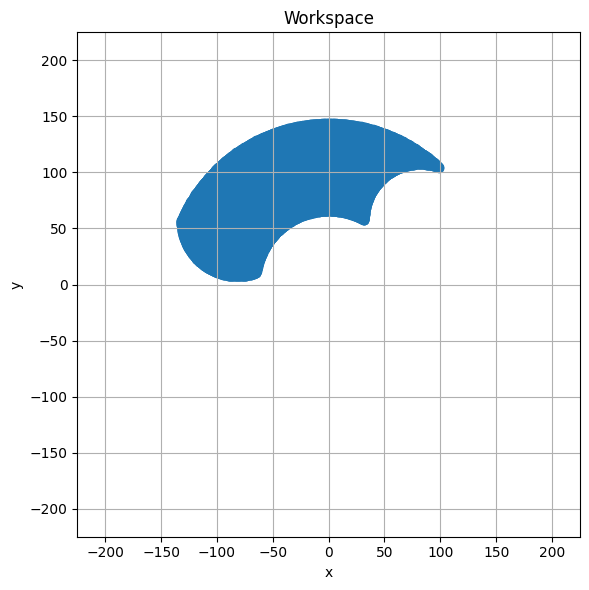

In [ ]:
# Approx run-time = 17s (for 40 frames)

q_lim = [[35, 35],      # q1, q2 - minimum angle   [Trom angles]
         [145, 145]]    # q1, q2 - maximum angle  [To angles]

def Workspace(q_lim, show=False):
  q_arr = []
  size = 200

  for q1_p in np.linspace(q_lim[0][0], q_lim[1][0], size):
    for q2_p in np.linspace(q_lim[0][1], q_lim[1][1], size):
      q_arr.append([q1_p, q2_p])

  states = []
  W_arr = [[] ,[]]
  for i in range(size**2):
    X, Y = forward_kinematics_eq1(q_arr[i])
    W_arr[0].append(X[2])
    W_arr[1].append(Y[2])


  t_max, num_steps = 25, len(q_arr)

  # Workspace Animation
  fig, ax = plt.subplots(figsize=(6, 6))  # Adjust the figure size to control the aspect ratio
  ax.set_xlim(-1.5 * (L[0] + L[1]), 1.5 * (L[0] + L[1]))
  ax.set_ylim(-1.5 * (L[0] + L[1]), 1.5 * (L[0] + L[1]))
  W_space, = ax.plot([], [], 'o-', lw=1)
  #links, = ax.plot([], [], 'o-', lw=2)

  def init():
    W_space.set_data([], [])
    return W_space

  # Modify below
  def animate(i):
    q = q_arr[i]

    W_space.set_data(W_arr)

    #if (show and (i%1000==0)):
    return W_space

  #ani = FuncAnimation(fig, animate, frames=num_steps, init_func=init, blit=True, interval=(t_max / num_steps) * 1000)

  plt.xlabel('x')
  plt.ylabel('y')
  plt.title('Workspace')
  plt.grid()

  plt.scatter(W_arr[0], W_arr[1])

  # Display the animation in the Jupyter Notebook
  from IPython.display import HTML
  HTML(ani.to_jshtml())

  return np.array(W_arr)

W_space = Workspace(q_lim, True)
W_space

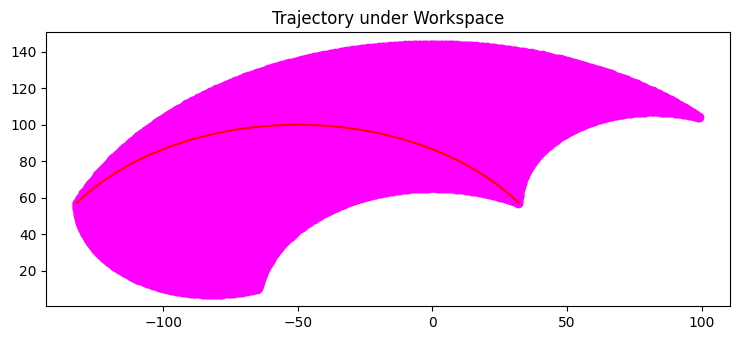

In [ ]:
# Approx run-time =

q_from_to = [[35, 145],  # q1, q2 - [From angles]
             [145, 35]]  # q1, q2 - [To angles]

Tr_fastest = Trajectory(q_from_to)  #returns xy from q_states of q_from_to
#W_space = Workspace(q_lim)

Scatter_plot_line(W_space, Tr_fastest, "Trajectory under Workspace")

In [ ]:
# Getting direction component of Trajectory and comparing with outer boundry of Workspace will be good idea
# But first have to remove extra filler values from W_space


C = W_space.transpose()
C[0], C[1]

(array([ 99.0162116 ,  98.56213628,  98.10651156, ..., -65.7238973 ,
        -65.26827258, -64.81419726]),
 array([104.34227467, 104.50506838, 104.66347386, ...,  10.05181341,
         10.21021889,  10.3730126 ]))

<Axes: xlabel='x', ylabel='y'>

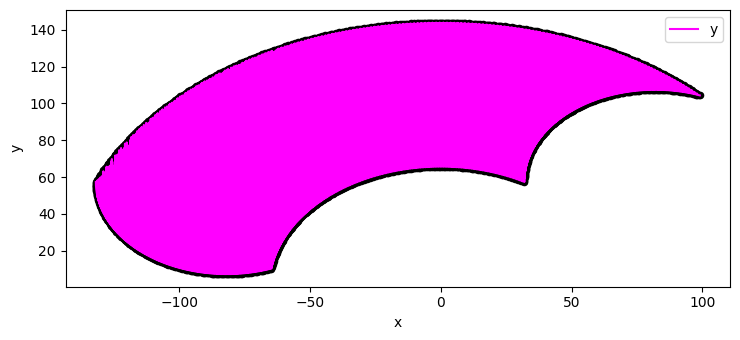

In [ ]:
df = pd.DataFrame({'x': C[0], 'y': C[1]})
df.plot.scatter('x', 'y', color='k')

Boundary = df.groupby('x').min()
Boundary.plot(ax=plt.gca(), color='magenta')

False


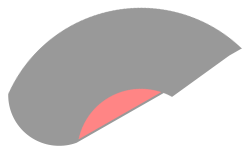

In [ ]:
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

point = Point(0, 0)
polygon = Polygon(W_space)
print(polygon.contains(point))

polygon

In [ ]:
W_space = np.array([[], []])

W_space.size, W_space.shape

(0, (2, 0))

In [ ]:
W_space

array([], shape=(2, 0), dtype=float64)

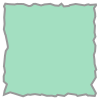

In [ ]:
alpha_shape

## Task-1 Trajectory planning

1. from (xy)1 [at (q1, q2)c] to (xy)2 requires (q1, q2)d, apply inverse kinematics.
- If need certain path, breakdown xy in multiple parts and apply similar

2. linspace angles according to animation size, collect states using forward kinematics


In [ ]:
forward_kinematics_eq1([145, 145])

[[0, -81.92, -64.81], [0, 57.36, 10.37]]

In [ ]:
# Getting q_plan (angles from - to) using inverse kinematics
x, y = -64.81, 10.37

q_d = inverse_kinematics_eq3(x, y)

q_plan = [q, q_d]
q_plan

[[35, 35], (145.0, 145.01)]

9.443

### q_state is an array which directs the way of movement

In [ ]:
# Velocity & time calculations

X, Y = forward_kinematics_eq1(q_plan[0])
x0, y0 = X[2], Y[2]

V = 20
t = round(np.sqrt((x-x0)**2 + (y-y0)**2)/V, 3)
t

# states of q during motion according to q_plan

t_max = t
num_steps = round(t*12)-1

q_states = [np.linspace(q_plan[0][0], q_plan[1][0], num_steps),
              np.linspace(q_plan[0][1], q_plan[1][1], num_steps)]
q_states = np.array(q_states).transpose()

states = []
#for i in range(num_steps): states.append(forward_kinematics_eq1(q_states[i]))

t_max, num_steps, len(q_states)

### Below animation only requires q_states to run

num_steps must be len(q_states)

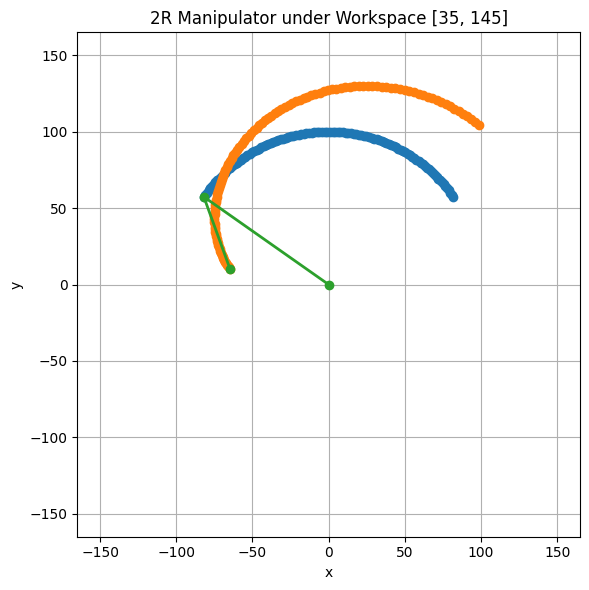

In [ ]:
#
def Animate_robot(q_states, W_space = np.array([[], []])):
  # Create animation

  fig, ax = plt.subplots(figsize=(6, 6))  # Adjust the figure size to control the aspect ratio
  ax.set_xlim(-1.1 * (L[0] + L[1]), 1.1 * (L[0] + L[1]))
  ax.set_ylim(-1.1 * (L[0] + L[1]), 1.1 * (L[0] + L[1]))

  if W_space.size: ax.plot(W_space[0], W_space[1], 'o-', lw=1)

  Tr_E, = ax.plot([], [], 'o-', lw=1)
  Tr_O1, = ax.plot([], [], 'o-', lw=1)
  links, = ax.plot([], [], 'o-', lw=2)

  def init():
      links.set_data([], [])
      Tr_E.set_data([], [])
      Tr_O1.set_data([], [])
      return Tr_E, links

  # Modify below
  def animate(i):
      q = q_states[i]
      x, y = forward_kinematics_eq1(q)

      Tr_L1[0].append(x[1]), Tr_L1[1].append(y[1])
      Tr_L2[0].append(x[2]), Tr_L2[1].append(y[2])

      links.set_data(x, y)
      Tr_E.set_data(Tr_L1[0], Tr_L1[1])
      Tr_O1.set_data(Tr_L2[0], Tr_L2[1])

      return Tr_E, links

  Tr_L2 = [[], []]
  Tr_L1 = [[], []]
  ani = FuncAnimation(fig, animate, frames=num_steps, init_func=init, blit=True, interval=(t_max / num_steps) * 1000)

  plt.xlabel('x')
  plt.ylabel('y')
  plt.title('2R Manipulator under Workspace [35, 145]')
  plt.grid()

  return ani

ani = Animate_robot(q_states)

# Display the animation in the Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
ani = Animate_robot(q_states, W_space)

# Display the animation in the Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
ani.save('ani1.mp4')

## Task-3

Assume a wall location and orientation, develop and implement using a Python simulation and visualization the task of the robot reaching the wall and then applying a prespecified force in the normal direction of the wall

# MK3

## Functions

### Forward Kinematics

- Robot constant Variable
- Get position from angle
- Velocity function (not done)
-
- Trajectory function (Fastest) with plot-simulations
- Workspace area points, with simulation
- Straingth Trajectory, with simulation

In [ ]:
# Import necessary functions

import numpy as np
import matplotlib.pyplot as plt


In [ ]:
# Constants

l = np.array([100, 50])    # link lengths

q = np.zeros(3)    # joint angles

O = np.zeros(3)   # Origin(0, 0, 0), just for Ref.
E = np.zeros(3)   # End effector position c0-ordinate

l, q, E, O

(array([100,  50]),
 array([0., 0., 0.]),
 array([0., 0., 0.]),
 array([0., 0., 0.]))

In [ ]:
O

array([0., 0., 0.])

In [ ]:
# Forward Kinematics

def Pos_XY(q):
  E = np.zeros(3)

  for i in range(2):
    E[0] += l[i]*np.cos(q[i]*np.pi/180)

  for i in range(2):
    E[1] += l[i]*np.sin(q[i]*np.pi/180)

  return E

def Vel_XY(q, w):
  V = np.zeros(3)

  for i in range(2):
    V[0] -= l[i]*np.sin(q[i]*np.pi/180)*w[i]

  for i in range(2):
    V[1] += l[i]*np.cos(q[i]*np.pi/180)*w[i]

  return V


q = [90, 0]
t = 10

w = np.array(q)*np.pi/180/t
print("Angular Velocity =", w)

Pos_XY(q), Vel_XY(q, w)

Angular Velocity = [0.15707963 0.        ]


(array([ 50., 100.,   0.]),
 array([-1.57079633e+01,  9.61835347e-16,  0.00000000e+00]))

w = angular velocity = q/t

t = time required to complete motion

In [ ]:
l

array([100,  50])

While thinking about q1, q2 angle in absolute manner, it contradicts with motion planning visualization (like q1 is moving, meanwhile q2 also change w.r.t q1 to keep its position in absolute coordinates)

So q2_new = q2-q1

Note: all calculations are with relative q2 below for ONLY 2R MANIPULATOR

(array([ 99.0162116 , 104.34227467]),
 array([81.91520443, 57.35764364]),
 array([0., 0.]))

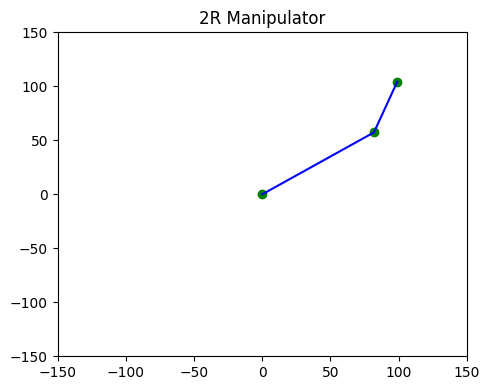

In [ ]:
# Forward Kinematics - v2.0

def Pos_XY(q, show=False):
  E = np.zeros(2)
  O = np.zeros(2)
  O1 = np.zeros(2)

  O1[0] = l[0]*np.cos(q[0]*np.pi/180)
  O1[1] = l[0]*np.sin(q[0]*np.pi/180)

  E[0] = O1[0] + l[1]*np.cos((q[0]+q[1])*np.pi/180)
  E[1] = O1[1] + l[1]*np.sin((q[0]+q[1])*np.pi/180)

  [X, Y] = np.array([O, O1, E]).transpose()
  #print(X, Y)

  if show:
    plt.rcParams["figure.figsize"] = [5, 4]
    plt.rcParams["figure.autolayout"] = True

    lim = l[0]+l[1]+10
    plt.xlim(-lim, lim)
    plt.ylim(-lim, lim)
    plt.title("2R Manipulator")

    lim = l[0]+l[1]
    plt.xlim(-lim, lim)
    plt.ylim(-lim, lim)

    plt.scatter(X, Y, color="green")
    plt.plot(X, Y, color="blue")

  return E, O1, O


q = [35, 35]
Pos_XY(q, True)

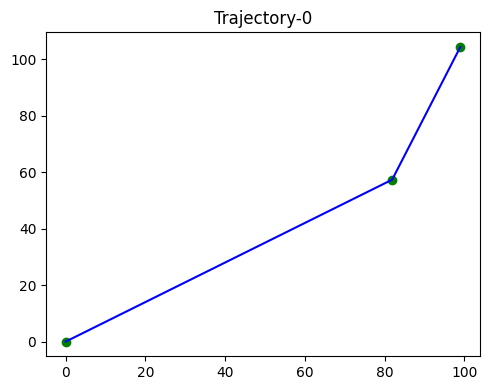

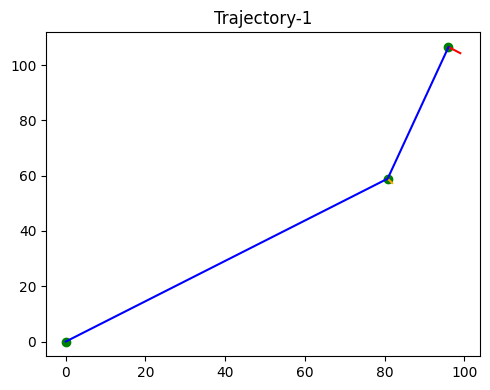

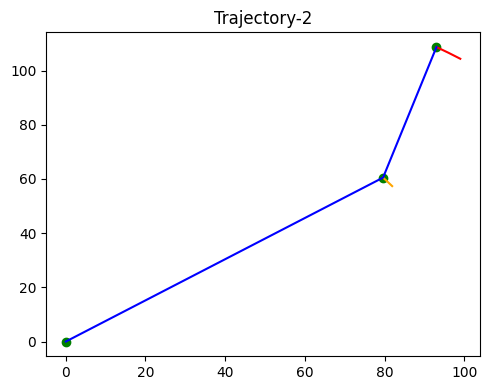

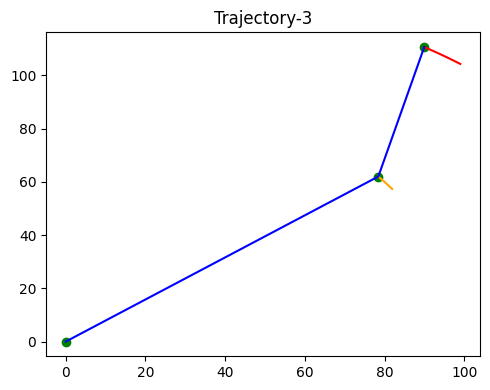

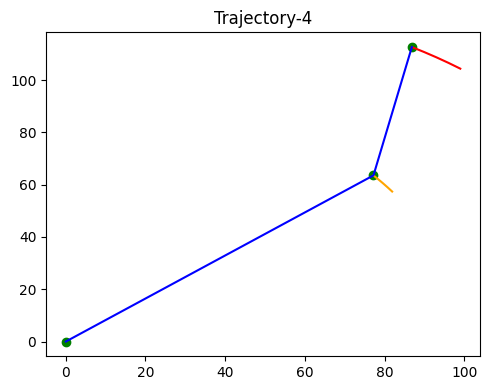

...

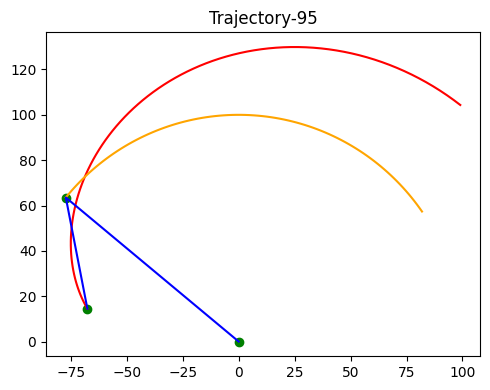

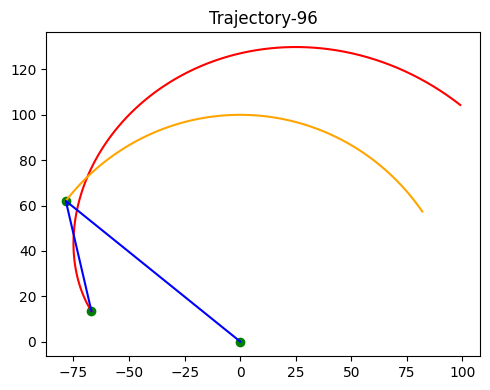

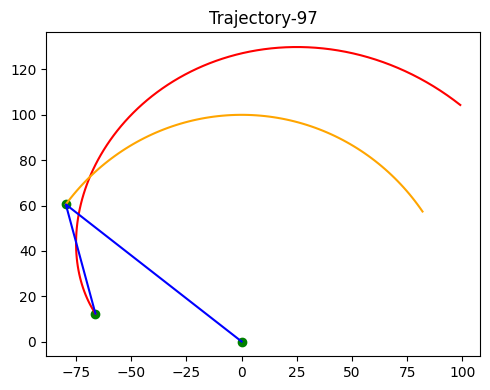

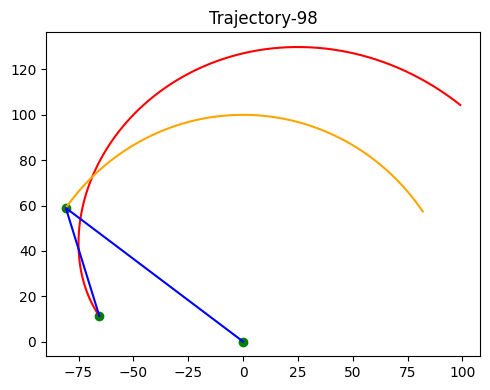

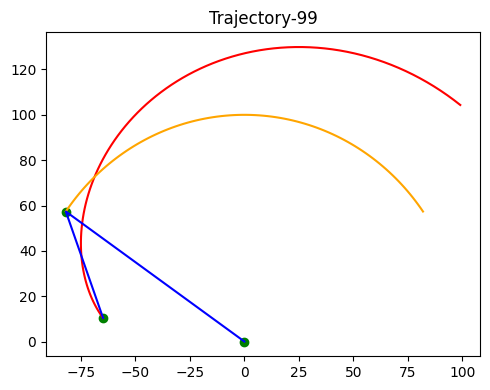

In [ ]:
"""
Here, I'm trying to get Workspace of Robot, but somehow the results are looking like fastest Trajectory.
So keeping as Trajectory function
"""

q_lim = [[35, 35],      # q1, q2 - minimum angle   [Trom angles]
         [145, 145]]    # q1, q2 - maximum angle  [To angles]

# Can I Call below a low speed one
def Trajectory(q_lim, show=False):
  q_arr = []
  size = 100
  for i in range(2):
    q_arr.append(np.linspace(q_lim[0][i], q_lim[1][i], size))
  q_arr = np.array(q_arr).transpose()
  #print(q_arr)

  Tr_arr = []
  Tr_arr_O1 = []
  for i in range(size):
    E, O1, O = Pos_XY(q_arr[i])
    Tr_arr.append(E)
    Tr_arr_O1.append(O1)

    if show:
      plt.title(f"Trajectory-{i}")

      [X, Y] = np.array(Tr_arr).transpose()
      plt.plot(X, Y, color="red")


      [X, Y] = np.array(Tr_arr_O1).transpose()
      plt.plot(X, Y, color="orange")

      [X, Y] = np.array([E, O1, O]).transpose()
      plt.plot(X, Y, color="blue")
      plt.scatter(X, Y, color="green")

      plt.show()
  return np.array(Tr_arr)

Tr_fastest = Trajectory(q_lim, True)
#Line_plot_array(Tr_fastest, "Trajectory-Final")

## Inverse Kinematics


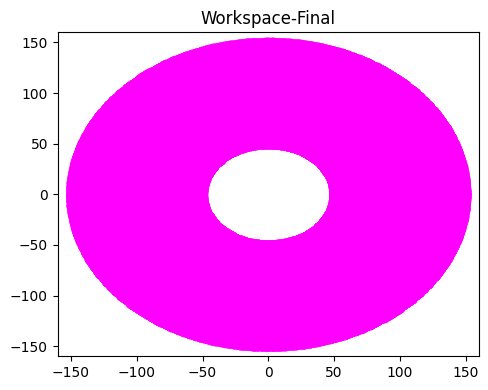

In [ ]:
l = [100, 50]
q_lim = [[0, 0],      # q1, q2 - minimum angle   [Trom angles]
         [360, 360]]    # q1, q2 - maximum angle  [To angles]

W_space = Workspace(q_lim)
Scatter_plot_array(W_space, "Workspace-Final")

In [ ]:
def Get_Angles(x, y):
  q2 = np.arccos((x**2 + y**2 - l[0]**2 - l[1]**2)/(2*l[0]*l[1]))

  if (x==0): q1 = np.pi/2 - np.arctan((l[1]*np.sin(q2)/(l[0]+l[1]*np.cos(q2))))
  else: q1 = np.arctan(y/x) - np.arctan((l[1]*np.sin(q2)/(l[0]+l[1]*np.cos(q2))))

  return q1*180/np.pi, q2*180/np.pi

Q = Get_Angles(150, 0)
Q

(0.0, 0.0)

(-90.0, 90.0)


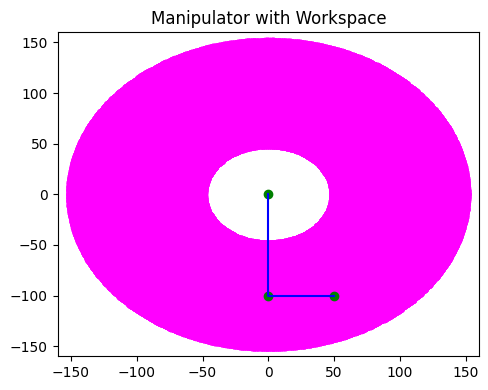

In [ ]:
Q = Get_Angles(-50, 100)
print(Q)

Scatter_plot_scatter(W_space, np.array(Pos_XY(Q)), "Manipulator with Workspace")

(array([ 99.0162116 , 104.34227467]),
 array([81.91520443, 57.35764364]),
 array([0., 0.]))

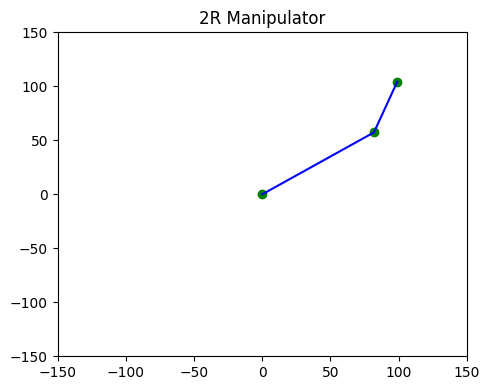

In [ ]:
Pos_XY([35, 35], True)

In [ ]:
q

[35, 35]

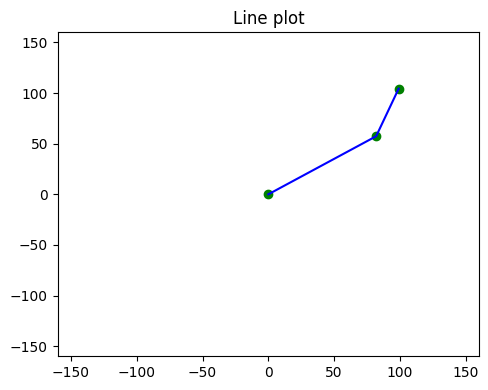

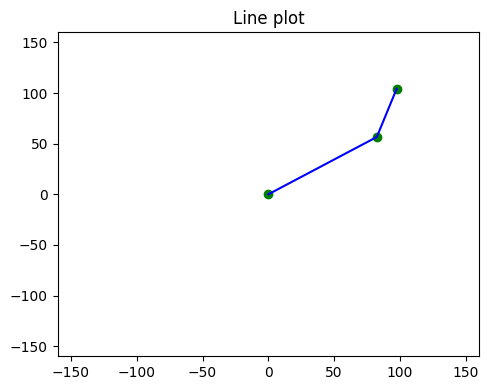

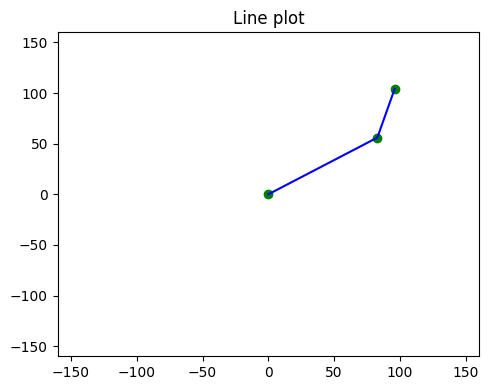

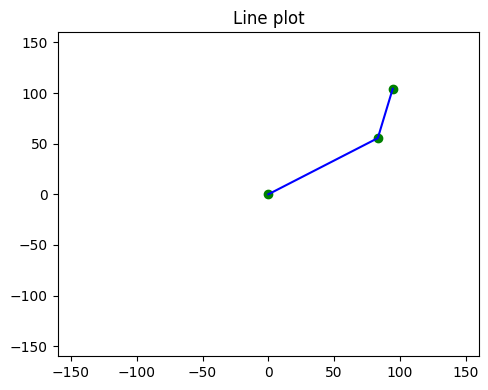

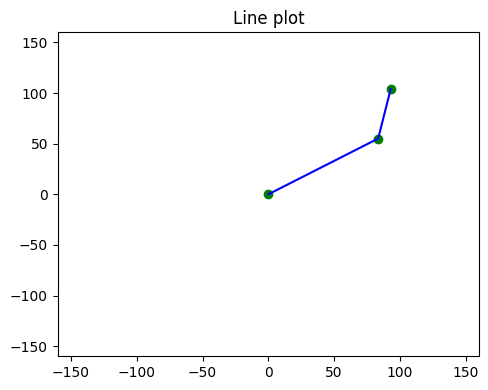

...

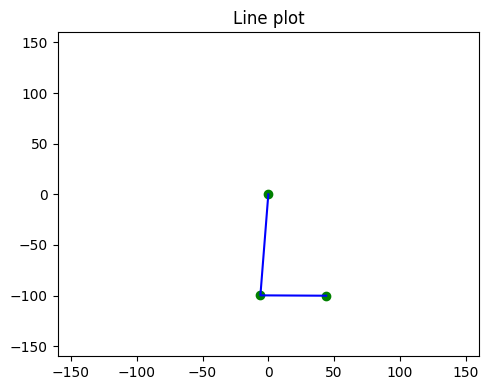

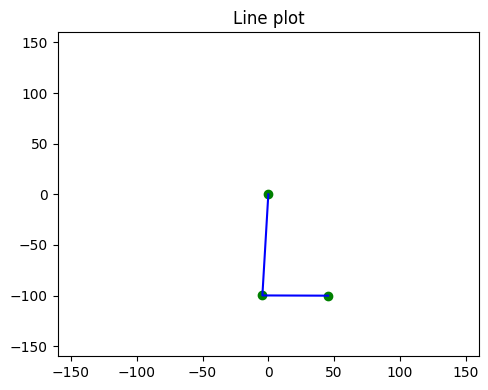

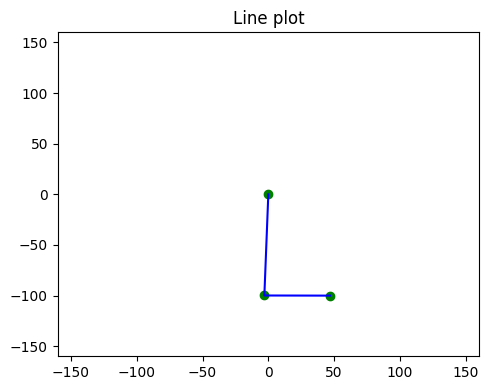

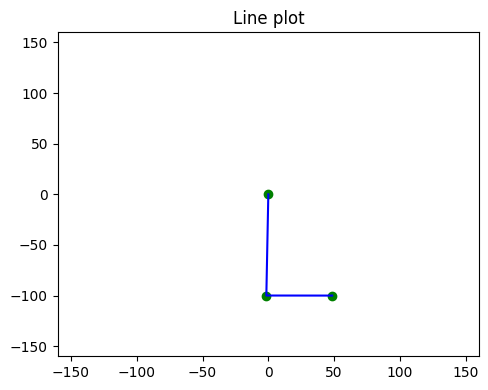

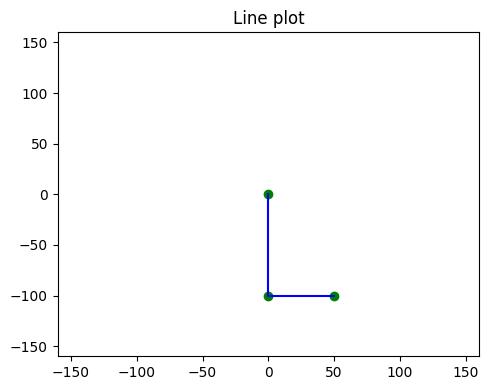

[(35.0, 35.00000000000003),
 (34.49278460658758, 37.93997003621529),
 (34.069824300089124, 40.65799532256316),
 (33.71718119462727, 43.19548621032858),
 (33.424871312427165, 45.582107167304834),
 (33.1854600953169, 47.8399555854491),
 (32.99324102193609, 49.986002821107895),
 (32.84372602415603, 52.033606737155004),
 (32.7333140758832, 53.99349407044317),
 (32.659067169884715, 55.87442348405159),
 (32.618553918039325, 57.68364768207327),
 (32.60973732581276, 59.42724434968432),
 (32.630892337035775, 61.110358744100935),
 (32.68054398766412, 62.737385158138125),
 (32.75742016365824, 64.31210508860573),
 (32.86041492229614, 65.83779410230693),
 (32.98855959431522, 67.31730565434019),
 (33.140999710934175, 68.75313765871691),
 (33.316976355477536, 70.14748596236342),
 (33.515810920537525, 71.5022877431331),
 (33.73689251799738, 72.81925706313386),
 (33.97966747852878, 74.09991424830636),
 (34.24363051375053, 75.34561036129621),
 (34.52831721416678, 76.55754773949748),
 (34.83329763007366,

In [ ]:
# Straigth Trajectory

def Trajectory_linier(x, y, q, show=False):

  # devide x, y in linier microsteps and get angles

  size = 100

  x0, y0 = Pos_XY(q)[0]
  X = np.linspace(x0, x, size)
  Y = np.linspace(y0, y, size)

  Q = []
  for i in range(size):
    qi = Get_Angles(X[i], Y[i])
    Q.append(qi)

    P = Pos_XY(qi, True)[0]
    Line_plot_array(P)

  return Q

Trajectory_linier(-50, 100, q=[35, 35])

## Workspace

In [ ]:
# Approx run-time = 17s (for 40 frames)

q_lim = [[35, 35],      # q1, q2 - minimum angle   [Trom angles]
         [145, 145]]    # q1, q2 - maximum angle  [To angles]

def Workspace(q_lim, show=False):
  q_arr = []
  size = 200
  for q1_p in np.linspace(q_lim[0][0], q_lim[1][0], size):
    for q2_p in np.linspace(q_lim[0][1], q_lim[1][1], size):
      q_arr.append([q1_p, q2_p])

  #q_arr = np.array(q_arr).transpose()
  #print(q_arr)

  W_arr = []
  for i in range(size*size):
    W_arr.append(Pos_XY(q_arr[i])[0])

    if (show and (i%1000==0)): Scatter_plot_array(np.array(W_arr), f"Workspace-{i}")

  return np.array(W_arr)

W_space = Workspace(q_lim, True)

NameError: ignored

# MK2


In [ ]:
!pip install roboticstoolbox-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.0/187.0 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.7/114.7 MB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 13.8 MB/s eta 0:00:00
  Created wheel for progress: filename=progress-1.6-py3-none-any.whl size=9612 sha256=737cbcad131506bf3125bdc704527723fe28222430aaf972cdf1980cd8551a8e
  Stored in directory: /root/.cache/pip/wheels/a2/68/5f/c339b20a41659d856c93ccdce6a33095493eb82c3964aac5a1
  Created wheel for rtb-data: filename=rtb_data-1.0.1-py3-none-any.whl size=115135912 sha256=4a7c8172ceb1f865bcc5b7f12f0a47b3f12c2de897bb12a923ea8736360fd161
  Stored in director

In [ ]:
import roboticstoolbox as rtb

DHRobot: 2 link, 2 joints (RR), dynamics, standard DH parameters
┌────┬────┬────┬──────┐
│θⱼ  │ dⱼ │ aⱼ │  ⍺ⱼ  │
├────┼────┼────┼──────┤
│ q1 │  0 │  1 │ 0.0° │
│ q2 │  0 │  1 │ 0.0° │
└────┴────┴────┴──────┘

┌─────┬──────┐
│base │ None │
└─────┴──────┘

┌─────┬──────┬──────┐
│name │ q0   │ q1   │
├─────┼──────┼──────┤
│  qr │  30° │ -30° │
│  qz │  0°  │  0°  │
│  q1 │  0°  │  90° │
│  q2 │  90° │ -90° │
│  qn │  30° │ -30° │
└─────┴──────┴──────┘



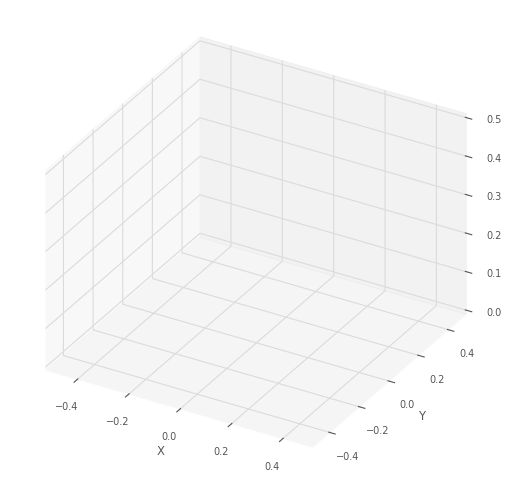

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

PyPlot3D backend, t = 0.05, scene:
  robot: Text(0.0, 0.0, '2 link')

In [ ]:
robot = rtb.models.DH.TwoLink()
print(robot)

robot.plot([1 ,1])

In [ ]:
print(robot.qr)

[ 0.52359878 -0.52359878]


# Mk1

In [ ]:
import sympy as sp

In [ ]:
from sympy.physics.vector import init_vprinting
init_vprinting(use_latex='mathjax', pretty_print=False)

In [ ]:
from IPython.display import Image
Image('fig/2rp_new.png', width=300)

FileNotFoundError: ignored

FileNotFoundError: ignored

<IPython.core.display.Image object>

In [ ]:
from sympy.physics.mechanics import dynamicsymbols

In [ ]:
theta1, theta2, l1, l2, theta, alpha, a, d = dynamicsymbols('theta1 theta2 l1 l2 theta alpha a d')
theta1, theta2, l1, l2, theta, alpha, a, d

(theta1, theta2, l1, l2, theta, alpha, a, d)

In [ ]:
px = mbee[0,2]
px

NameError: ignored

# Ref
